In [1]:
import tensorflow as tf
import numpy as np
import glob
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from model import MY_MODEL
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, LearningRateScheduler
from tensorflow.keras.metrics import Precision, Recall
%matplotlib inline

2024-04-30 19:43:49.388230: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-30 19:43:50.351292: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
img_train = glob.glob('./images/train/*/*.png')
label_train = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img_train]

img_val = glob.glob('./images/val/*/*.png')
label_val = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img_val]

img_combined = img_train + img_val
label_combined = label_train + label_val

index = np.random.permutation(len(img_combined))
img_combined = np.array(img_combined)[index]
label_combined = np.array(label_combined)[index]

split_index = int(len(img_combined) * 0.8)
img_train_new = img_combined[:split_index]
label_train_new = label_combined[:split_index]
img_val_new = img_combined[split_index:]
label_val_new = label_combined[split_index:]

dataset_train = tf.data.Dataset.from_tensor_slices((img_train_new, label_train_new))
dataset_val = tf.data.Dataset.from_tensor_slices((img_val_new, label_val_new))

print(len(label_train_new), len(label_val_new))

2780 695


2024-04-30 19:43:51.866684: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-30 19:43:51.874552: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-30 19:43:51.874814: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

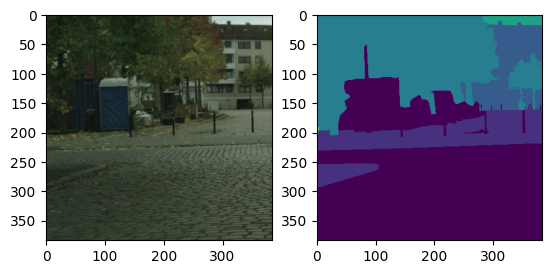

In [3]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

def read_png_label(path):
    with tf.device('/cpu:0'): 
        img = tf.io.read_file(path)
        img = tf.image.decode_png(img, channels=1)
        img = tf.where(img == 255, tf.zeros_like(img), img)
    return img

def crop_img(img, mask):

    img_uint8 = tf.cast(img, tf.uint8)

    concat_img = tf.concat([img_uint8, mask], axis=-1)
    concat_img = tf.image.resize(concat_img, (512, 1024), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    crop_img = tf.image.random_crop(concat_img, [384, 384, tf.shape(concat_img)[-1]])

    return crop_img[:, :, :3], tf.cast(crop_img[:, :, 3:], mask.dtype)



img_1 = read_png(img_train_new[0])
label_1 = read_png_label(label_train_new[0])
concat_img = tf.concat([img_1, label_1], axis=-1)
img_1, label_1 = crop_img(img_1, label_1)

plt.subplot(1,2,1)
plt.imshow(img_1.numpy())
plt.subplot(1,2,2)
plt.imshow(np.squeeze(label_1.numpy()))

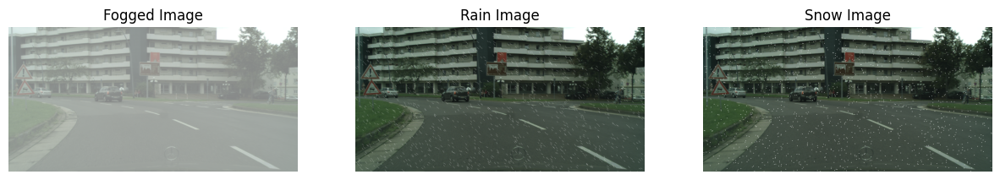

In [4]:
def add_fog_effect(image, fog_intensity=0.5):
    h, w = image.shape[:2]
    white_layer = np.ones((h, w, 3), dtype=np.uint8) * 255
    fogged_image = cv2.addWeighted(image, 1 - fog_intensity, white_layer, fog_intensity, 0)
    return fogged_image

def simulate_rain_effect(image, rain_density=1500, rain_width=1, rain_length=15):
    h, w = image.shape[:2]
    rain_image = image.copy()
    
    for _ in range(rain_density):
        x1 = np.random.randint(0, w)
        y1 = np.random.randint(0, h)
        x2 = x1 + np.random.randint(rain_length//2, rain_length)
        y2 = y1 + np.random.randint(rain_length//2, rain_length)
        cv2.line(rain_image, (x1, y1), (x2, y2), (255, 255, 255), rain_width)
    
    return rain_image

def simulate_snow_effect(image, snow_density=1500, snow_size=2):
    h, w = image.shape[:2]
    snow_image = image.copy()
    
    for _ in range(snow_density):
        x = np.random.randint(0, w)
        y = np.random.randint(0, h)
        cv2.circle(snow_image, (x, y), snow_size, (255, 255, 255), -1)
    
    return snow_image

image_path = 'images/train/aachen/aachen_000000_000019_leftImg8bit.png'
image = cv2.imread(image_path)

fogged_image = add_fog_effect(image, 0.5)
rain_image = simulate_rain_effect(image, 1500, 1, 15)
snow_image = simulate_snow_effect(image, 1500, 2)

import matplotlib.pyplot as plt

fogged_image_rgb = cv2.cvtColor(fogged_image, cv2.COLOR_BGR2RGB)
rain_image_rgb = cv2.cvtColor(rain_image, cv2.COLOR_BGR2RGB)
snow_image_rgb = cv2.cvtColor(snow_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(fogged_image_rgb)
plt.title('Fogged Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(rain_image_rgb)
plt.title('Rain Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(snow_image_rgb)
plt.title('Snow Image')
plt.axis('off') 

plt.show()

In [5]:
def tf_add_fog_effect(image, intensity):
    def add_fog_effect(image, intensity):
        h, w = image.shape[:2]
        white_layer = np.ones((h, w, 3), dtype=np.uint8) * 255
        fogged_image = cv2.addWeighted(image, 1 - intensity, white_layer, intensity, 0)
        return fogged_image

    [fogged_image] = tf.numpy_function(add_fog_effect, [image, intensity], [tf.uint8])
    fogged_image.set_shape(image.shape)
    return fogged_image

def tf_simulate_rain_effect(image, density, width, length):
    def simulate_rain_effect(image, density, width, length):
        h, w = image.shape[:2]
        rain_image = image.copy()

        for _ in range(density):
            x1 = np.random.randint(0, w)
            y1 = np.random.randint(0, h)
            x2 = x1 + np.random.randint(length//2, length)
            y2 = y1 + np.random.randint(length//2, length)
            cv2.line(rain_image, (x1, y1), (x2, y2), (255, 255, 255), width)

        return rain_image

    [rain_image] = tf.numpy_function(simulate_rain_effect, [image, density, width, length], [tf.uint8])
    rain_image.set_shape(image.shape)
    return rain_image

def tf_simulate_snow_effect(image, density, size):
    def simulate_snow_effect(image, density, size):
        h, w = image.shape[:2]
        snow_image = image.copy()

        for _ in range(density):
            x = np.random.randint(0, w)
            y = np.random.randint(0, h)
            cv2.circle(snow_image, (x, y), size, (255, 255, 255), -1)

        return snow_image

    [snow_image] = tf.numpy_function(simulate_snow_effect, [image, density, size], [tf.uint8])
    snow_image.set_shape(image.shape)
    return snow_image

In [6]:
def normal(img, mask):
    img = tf.cast(img, tf.float32)/127.5 -1
    mask = tf.cast(mask, tf.int32)
    return img, mask


# def apply_sobel_filter(image, enhancement_factor=1.0):
#     image_np = image.numpy()
#     gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
#     sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
#     sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
#     sobel = np.sqrt(sobelx**2 + sobely**2)
    
#     sobel_normalized = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX)
    
#     sobel_adjusted = sobel_normalized * enhancement_factor
    
#     sobel_tensor = tf.convert_to_tensor(sobel_adjusted, dtype=tf.float32)
    
#     sobel_tensor_resized = tf.image.resize(sobel_tensor[..., tf.newaxis], [image.shape[0], image.shape[1]])
    
#     return sobel_tensor_resized / 255.0

def load_image_train(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    img = tf.image.random_saturation(img, lower=0.5, upper=1.5)
    img = tf.image.random_hue(img, max_delta=0.2)
    img = tf.image.random_contrast(img, lower=0.5, upper=1.5)
    img = tf.clip_by_value(img, 0, 255)
    
    scale = tf.random.uniform([], 0.7, 2)
    new_height = tf.cast(tf.cast(tf.shape(img)[0], tf.float32) * scale, tf.int32)
    new_width = tf.cast(tf.cast(tf.shape(img)[1], tf.float32) * scale, tf.int32)
    img = tf.image.resize(img, [new_height, new_width])
    mask = tf.image.resize(mask, [new_height, new_width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    img, mask = crop_img(img, mask)
    
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)
        
    
    if tf.random.uniform(()) > 0.98:
        img = tf_add_fog_effect(img, 0.2)
    if tf.random.uniform(()) > 0.98:
        img = tf_simulate_rain_effect(img, 100, 1, 15)
    if tf.random.uniform(()) > 0.98:
        img = tf_simulate_snow_effect(img, 100, 2)
    
    # img = tf.py_function(func=apply_sobel_filter, inp=[img], Tout=tf.float32)

    img, mask = normal(img, mask)

    return img, mask


def load_image_val(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    img, mask = crop_img(img, mask)
        
    img, mask = normal(img, mask)
    
    return img, mask

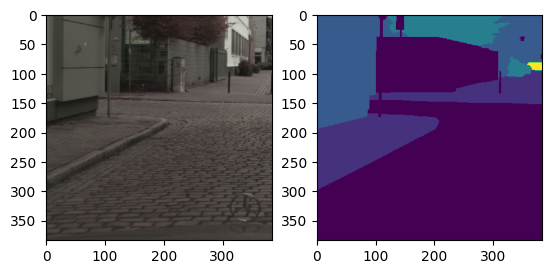

In [7]:
BCTCH_SIZE = 24
# BUFFER_SIZE = 128
# step_per_epoch = train_count//BCTCH_SIZE
# val_step = val_count//BCTCH_SIZE

auto = tf.data.experimental.AUTOTUNE
dataset_train = dataset_train.map(load_image_train, num_parallel_calls=auto)
dataset_val = dataset_val.map(load_image_val, num_parallel_calls=auto)

for i, m in dataset_train.take(1):
    plt.subplot(1,2,1)
    plt.imshow((i.numpy() + 1)/2)
    plt.subplot(1,2,2)
    plt.imshow(np.squeeze(m.numpy()))

dataset_train = dataset_train.batch(BCTCH_SIZE)
dataset_val = dataset_val.batch(BCTCH_SIZE)

In [8]:
dataset_train

<_BatchDataset element_spec=(TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 384, 384, 1), dtype=tf.int32, name=None))>

In [9]:
model = MY_MODEL(384, 384, 11)

*** Building MODEL Network ***


/home/featurize/data/resnet/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


*** Output_Shape => (None, 384, 384, 11) ***


In [10]:
# model.summary()

In [11]:
# for layer in model.layers:
#     if isinstance(layer, tf.keras.layers.BatchNormalization):
#         layer.momentum = 0.9997
#     elif isinstance(layer, tf.keras.layers.Conv2D):
#         layer.kernel_regularizer = tf.keras.regularizers.l2(1e-4)
# reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
#     monitor='val_loss', 
#     factor=0.1,         
#     patience=10,         
#     min_lr=0.000001,     
#     verbose=1
# )

In [12]:
# def softmax_dice_loss(y_true, y_pred_logits):
#     # Apply softmax to convert logits to probabilities
#     y_pred = tf.nn.softmax(y_pred_logits)
    
#     # Convert labels to one-hot encoding
#     y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=tf.shape(y_pred)[-1])
    
#     # Define smooth term to avoid division by zero
#     smooth = 1e-6
    
#     # Initialize variable to accumulate loss
#     total_loss = 0.0
    
#     # Calculate Dice Loss for each class
#     for class_idx in range(y_pred.shape[-1]):
#         # Calculate intersection and union for the current class
#         y_true_class = y_true[..., class_idx]
#         y_pred_class = y_pred[..., class_idx]
        
#         # Remove the extra dimension from y_true_class
#         y_true_class = tf.squeeze(y_true_class, axis=-1)  # <-- This is the key line
        
#         intersection = tf.reduce_sum(y_true_class * y_pred_class)
#         union = tf.reduce_sum(y_true_class + y_pred_class)
        
#         # Compute Dice coefficient and subtract from 1 for loss
#         dice_coeff = (2. * intersection + smooth) / (union + smooth)
#         dice_loss = 1 - dice_coeff
        
#         # Accumulate loss
#         total_loss += dice_loss
    
#     # Average the loss across all classes
#     return total_loss / tf.cast(y_pred.shape[-1], tf.float32)

In [13]:
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __call__(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().__call__(y_true, y_pred, sample_weight=sample_weight)

# optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)


def dice_loss_multiclass(y_true, y_pred, num_classes=11, smooth=1e-6):
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=num_classes)
    y_true = tf.cast(y_true, tf.float32)
    
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    dice_loss = 0
    for c in range(num_classes):
        true_c = y_true[..., c]
        pred_c = y_pred[..., c]
        
        true_c = tf.squeeze(true_c, axis=-1)
        
        intersection = tf.reduce_sum(true_c * pred_c, axis=[1, 2])
        union = tf.reduce_sum(true_c, axis=[1, 2]) + tf.reduce_sum(pred_c, axis=[1, 2])
        dice_c = (2. * intersection + smooth) / (union + smooth)
        dice_loss += (1 - dice_c)
    
    return dice_loss / num_classes

def combined_loss_multiclass(y_true, y_pred, num_classes=11):
    ce_loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)(y_true, y_pred)
    d_loss = dice_loss_multiclass(y_true, y_pred, num_classes)
    total_loss = (ce_loss + d_loss) / 2.0
    return total_loss

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
train_iou = MeanIoU(11, name='train_iou')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')
test_iou = MeanIoU(11, name='test_iou')

In [14]:
base_learning_rate = 0.01
momentum = 0.9
weight_decay = 0.0001
power = 1.2
total_steps = 18550

learning_rate_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=base_learning_rate,
    decay_steps=total_steps,
    end_learning_rate=0.0, 
    power=power
)

class SGDW(tf.keras.optimizers.SGD):
    def __init__(self, weight_decay, *args, **kwargs):
        super(SGDW, self).__init__(*args, **kwargs)
        self.weight_decay = weight_decay

    def _resource_apply_dense(self, grad, var, apply_state=None):
        var_dtype = var.dtype.base_dtype
        lr_t = self._decayed_lr(var_dtype)
        wd = lr_t * self.weight_decay

        var.assign_sub((lr_t * grad) + (wd * var))

optimizer = SGDW(
    weight_decay=weight_decay,
    learning_rate=learning_rate_schedule,
    momentum=momentum
)

In [15]:
train_losses = []
train_accuracies = []
train_ious = []
test_losses = []
test_accuracies = []
test_ious = []
train_precisions = []
train_recalls = []
test_precisions = []
test_recalls = []


train_precision = Precision()
train_recall = Recall()
test_precision = Precision()
test_recall = Recall()

@tf.function
def train_step(images, labels):
    with tf.GradientTape() as tape:
        predictions = model(images, training=True)
        loss = combined_loss_multiclass(labels, predictions, 11)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    train_loss(loss)
    train_accuracy(labels, predictions)
    train_iou(labels, predictions)
    train_precision.update_state(labels, tf.argmax(predictions, axis=-1))
    train_recall.update_state(labels, tf.argmax(predictions, axis=-1))

@tf.function
def test_step(images, labels):
    predictions = model(images, training=False)
    t_loss = combined_loss_multiclass(labels, predictions, 11)

    test_loss(t_loss)
    test_accuracy(labels, predictions)
    test_iou(labels, predictions)
    test_precision.update_state(labels, tf.argmax(predictions, axis=-1))
    test_recall.update_state(labels, tf.argmax(predictions, axis=-1))

EPOCHS = 90

for epoch in range(EPOCHS):
    train_loss.reset_states()
    train_accuracy.reset_states()
    train_iou.reset_states()
    train_precision.reset_states()
    train_recall.reset_states()
    test_loss.reset_states()
    test_accuracy.reset_states()
    test_iou.reset_states()
    test_precision.reset_states()
    test_recall.reset_states()

    for images, labels in dataset_train:
        train_step(images, labels)

    for test_images, test_labels in dataset_val:
        test_step(test_images, test_labels)


    print('Epoch {:3d}, Loss: {:.3f}, Accuracy: {:.3f}, IOU: {:.3f}, Precision: {:.3f}, Recall: {:.3f}, Test Loss: {:.3f}, Test Accuracy: {:.3f}, Test IOU: {:.3f}, Test Precision: {:.3f}, Test Recall: {:.3f}'.format(
        epoch+1, train_loss.result(), train_accuracy.result()*100, train_iou.result(), 
        train_precision.result(), train_recall.result(), 
        test_loss.result(), test_accuracy.result()*100, test_iou.result(), 
        test_precision.result(), test_recall.result()
    ))

    train_losses.append(train_loss.result())
    train_accuracies.append(train_accuracy.result().numpy() * 100)
    train_ious.append(train_iou.result())
    train_precisions.append(train_precision.result().numpy())
    train_recalls.append(train_recall.result().numpy())
    test_losses.append(test_loss.result())
    test_accuracies.append(test_accuracy.result().numpy() * 100)
    test_ious.append(test_iou.result())
    test_precisions.append(test_precision.result().numpy())
    test_recalls.append(test_recall.result().numpy())

2024-04-30 19:44:13.696139: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-04-30 19:44:15.995808: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-04-30 19:44:22.304827: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f0282b515c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-30 19:44:22.304896: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-04-30 19:44:22.380498: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch   1, Loss: 0.682, Accuracy: 80.554, IOU: 0.357, Precision: 0.868, Recall: 0.881, Test Loss: 1.277, Test Accuracy: 50.571, Test IOU: 0.050, Test Precision: 0.951, Test Recall: 0.039
Epoch   2, Loss: 0.511, Accuracy: 86.807, IOU: 0.478, Precision: 0.896, Recall: 0.926, Test Loss: 1.204, Test Accuracy: 52.060, Test IOU: 0.058, Test Precision: 0.907, Test Recall: 0.080
Epoch   3, Loss: 0.477, Accuracy: 88.303, IOU: 0.522, Precision: 0.905, Recall: 0.934, Test Loss: 1.039, Test Accuracy: 61.568, Test IOU: 0.121, Test Precision: 0.902, Test Recall: 0.431
Epoch   4, Loss: 0.457, Accuracy: 89.204, IOU: 0.554, Precision: 0.912, Recall: 0.938, Test Loss: 1.063, Test Accuracy: 59.475, Test IOU: 0.136, Test Precision: 0.919, Test Recall: 0.243
Epoch   5, Loss: 0.449, Accuracy: 89.528, IOU: 0.592, Precision: 0.913, Recall: 0.940, Test Loss: 0.667, Test Accuracy: 79.268, Test IOU: 0.376, Test Precision: 0.876, Test Recall: 0.867
Epoch   6, Loss: 0.441, Accuracy: 89.959, IOU: 0.602, Precision: 

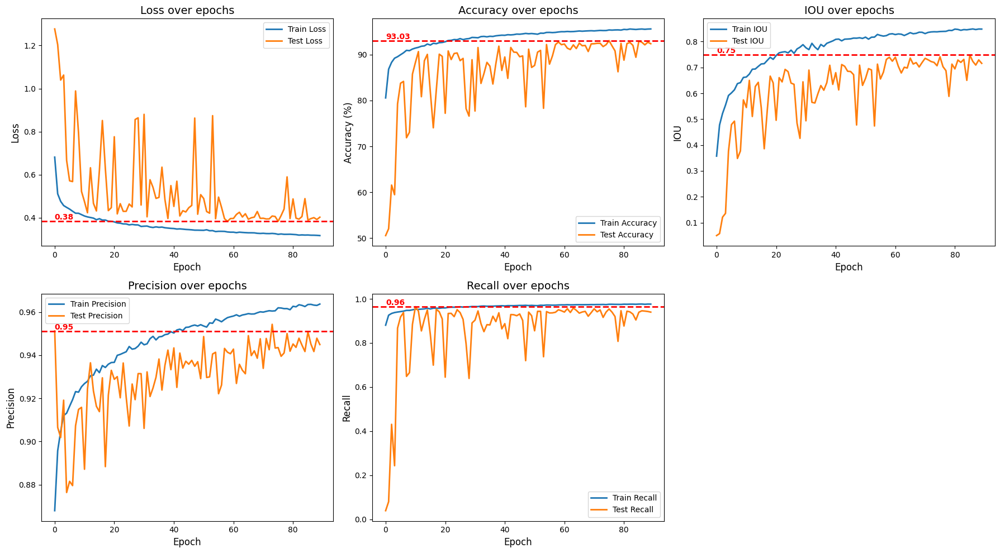

In [16]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

plt.figure(figsize=(18, 10))

def draw_plot(position, metric_name, train_data, test_data, ylabel, find_max=True, second_max=False):
    plt.subplot(2, 3, position)
    plt.plot(train_data, label=f'Train {metric_name}', linewidth=2)
    plt.plot(test_data, label=f'Test {metric_name}', linewidth=2)
    plt.title(f'{metric_name} over epochs', fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    
    if find_max:
        special_value = max(test_data)
        if second_max:
            temp_data = test_data.copy()
            temp_data.remove(special_value)
            special_value = max(temp_data)
        line_label = 'Max' if not second_max else '2nd Max'
    else:
        special_value = min(test_data)
        line_label = 'Min'
    
    plt.axhline(y=special_value, color='r', linestyle='--', linewidth=2)
    plt.text(0, special_value, f'{special_value:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
    plt.legend(loc='best')

draw_plot(1, 'Loss', train_losses, test_losses, 'Loss', find_max=False)
draw_plot(2, 'Accuracy', train_accuracies, test_accuracies, 'Accuracy (%)', find_max=True)
draw_plot(3, 'IOU', train_ious, test_ious, 'IOU', find_max=True)
draw_plot(4, 'Precision', train_precisions, test_precisions, 'Precision', find_max=True, second_max=True)
draw_plot(5, 'Recall', train_recalls, test_recalls, 'Recall', find_max=True)

plt.tight_layout()
plt.show()

In [17]:
# model.save('my_model.h5') 

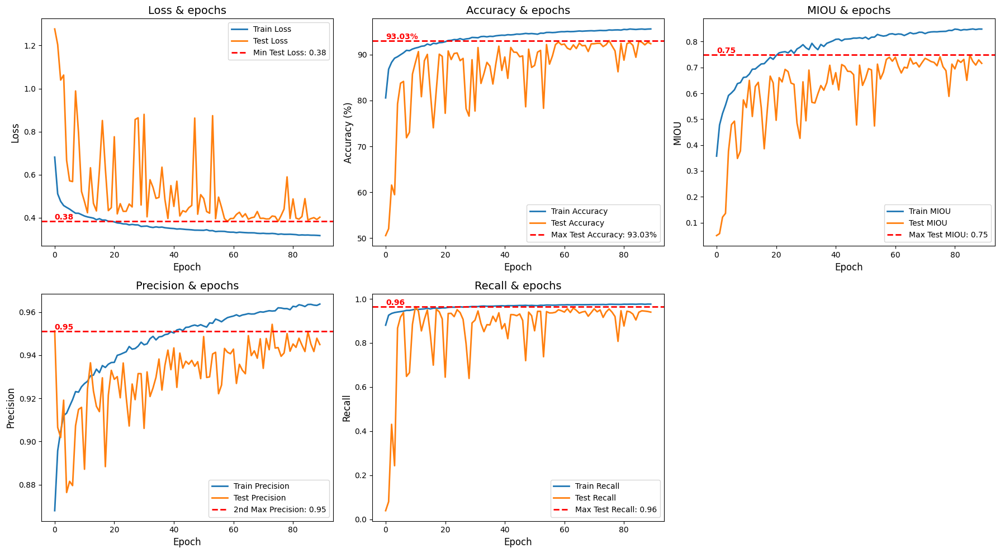

In [18]:
plt.figure(figsize=(18, 10))

# Enhanced Loss plot
plt.subplot(2, 3, 1)
plt.plot(train_losses, label='Train Loss', linewidth=2)
plt.plot(test_losses, label='Test Loss', linewidth=2)
plt.title('Loss & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
min_loss = min(test_losses)
plt.axhline(y=min_loss, color='r', linestyle='--', linewidth=2)
plt.text(0, min_loss, f'{min_loss:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Min Test Loss: {min_loss:.2f}'))
plt.legend(handles=handles, loc='upper right')

# Enhanced Accuracy plot
plt.subplot(2, 3, 2)
plt.plot(train_accuracies, label='Train Accuracy', linewidth=2)
plt.plot(test_accuracies, label='Test Accuracy', linewidth=2)
plt.title('Accuracy & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy (%)', fontsize=12)
max_accuracy = max(test_accuracies)
plt.axhline(y=max_accuracy, color='r', linestyle='--', linewidth=2)
plt.text(0, max_accuracy, f'{max_accuracy:.2f}%', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test Accuracy: {max_accuracy:.2f}%'))
plt.legend(handles=handles, loc='lower right')

# Enhanced IOU plot
plt.subplot(2, 3, 3)
plt.plot(train_ious, label='Train MIOU', linewidth=2)
plt.plot(test_ious, label='Test MIOU', linewidth=2)
plt.title('MIOU & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('MIOU', fontsize=12)
max_iou = max(test_ious)
plt.axhline(y=max_iou, color='r', linestyle='--', linewidth=2)
plt.text(0, max_iou, f'{max_iou:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test MIOU: {max_iou:.2f}'))
plt.legend(handles=handles, loc='lower right')

plt.subplot(2, 3, 4)
plt.plot(train_precisions, label='Train Precision', linewidth=2)
plt.plot(test_precisions, label='Test Precision', linewidth=2)
plt.title('Precision & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Precision', fontsize=12)
temp_precisions = test_precisions.copy()
temp_precisions.remove(max(temp_precisions))
second_max_precisions = max(temp_precisions)
plt.axhline(y=second_max_precisions, color='r', linestyle='--', linewidth=2)
plt.text(0, second_max_precisions, f'{second_max_precisions:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'2nd Max Precision: {second_max_precisions:.2f}'))
plt.legend(handles=handles, loc='lower right')


# Enhanced Recall plot
plt.subplot(2, 3, 5)
line1, = plt.plot(train_recalls, label='Train Recall', linewidth=2)
line2, = plt.plot(test_recalls, label='Test Recall', linewidth=2)
plt.title('Recall & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Recall', fontsize=12)
max_recall = max(test_recalls)
max_index = test_recalls.index(max_recall)
plt.axhline(y=max_recall, color='r', linestyle='--', linewidth=2)
legend_line = Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test Recall: {max_recall:.2f}')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(legend_line)
plt.legend(handles=handles, loc='lower right')
plt.text(0, max_recall, f'{max_recall:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')

plt.tight_layout()
plt.show()

1/1 [==============================] - 2s 2s/step


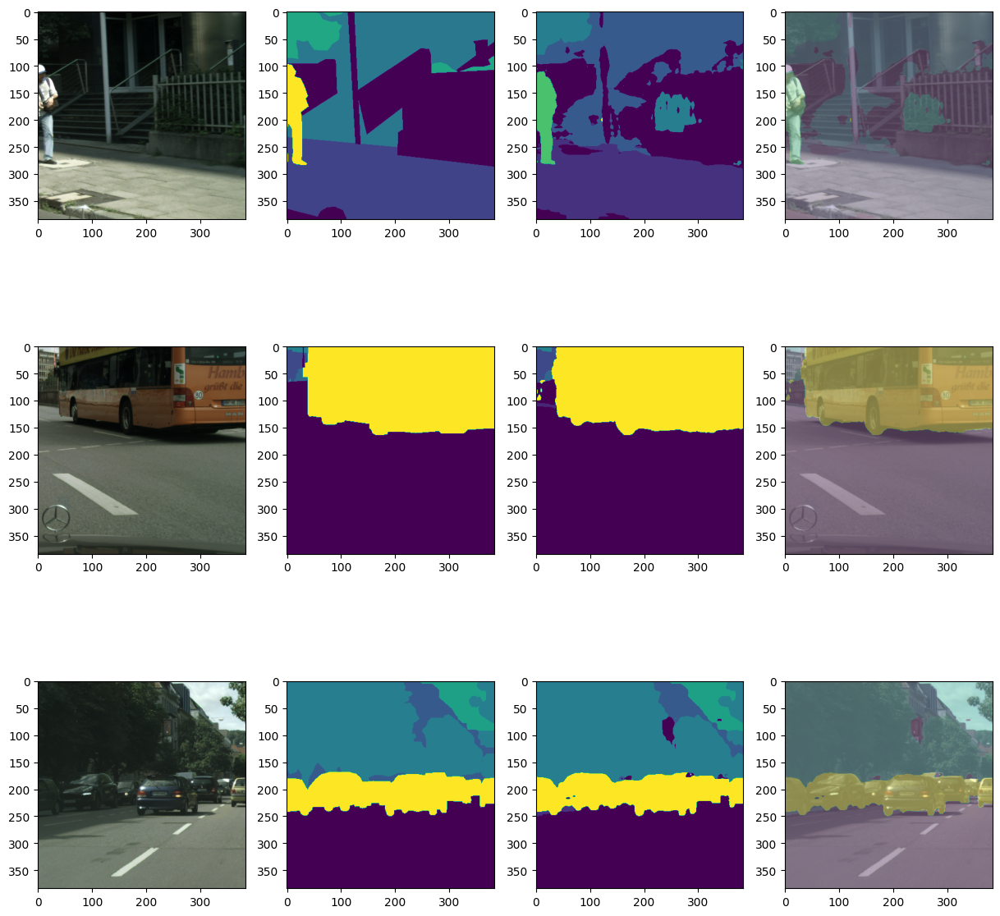

1/1 [==============================] - 0s 151ms/step


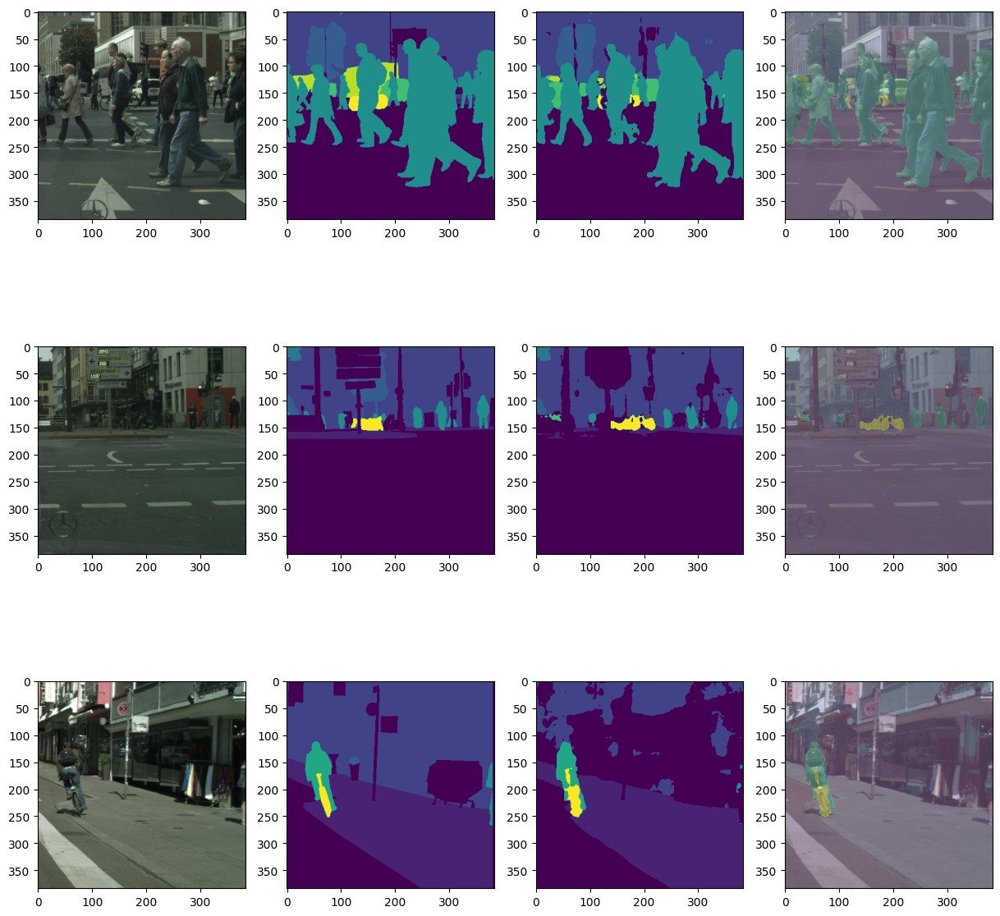

1/1 [==============================] - 0s 133ms/step


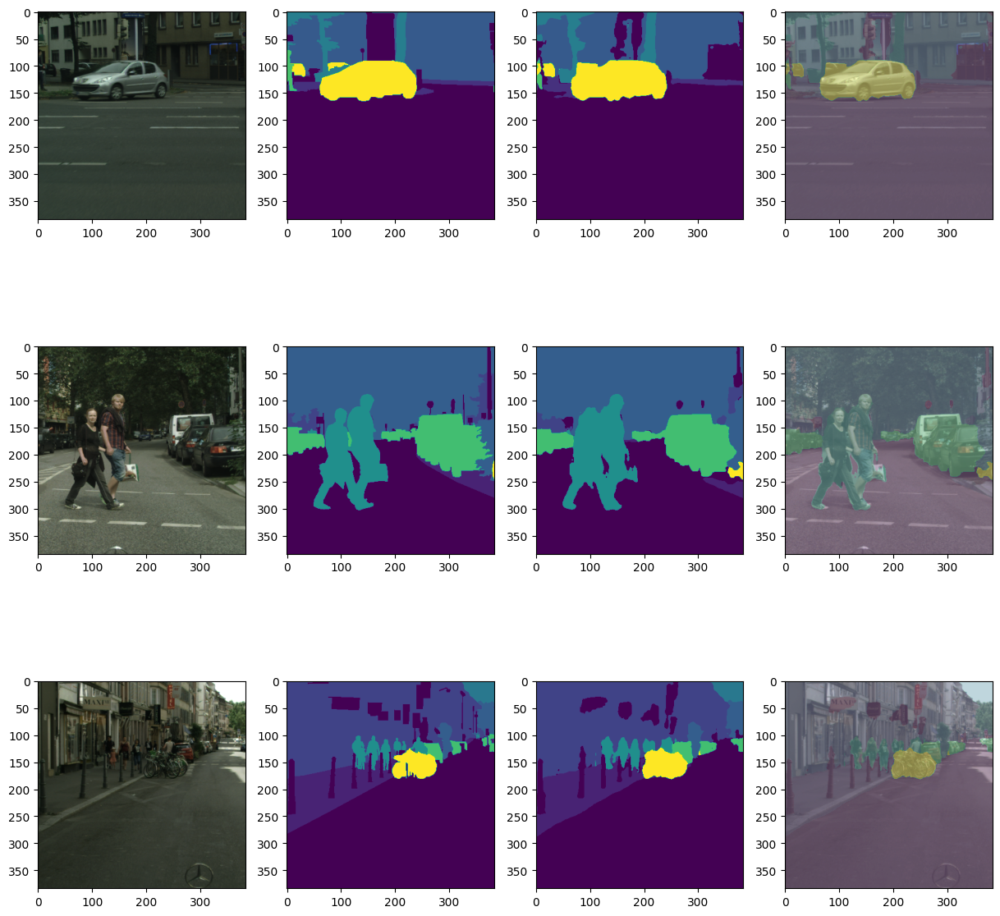

1/1 [==============================] - 0s 127ms/step


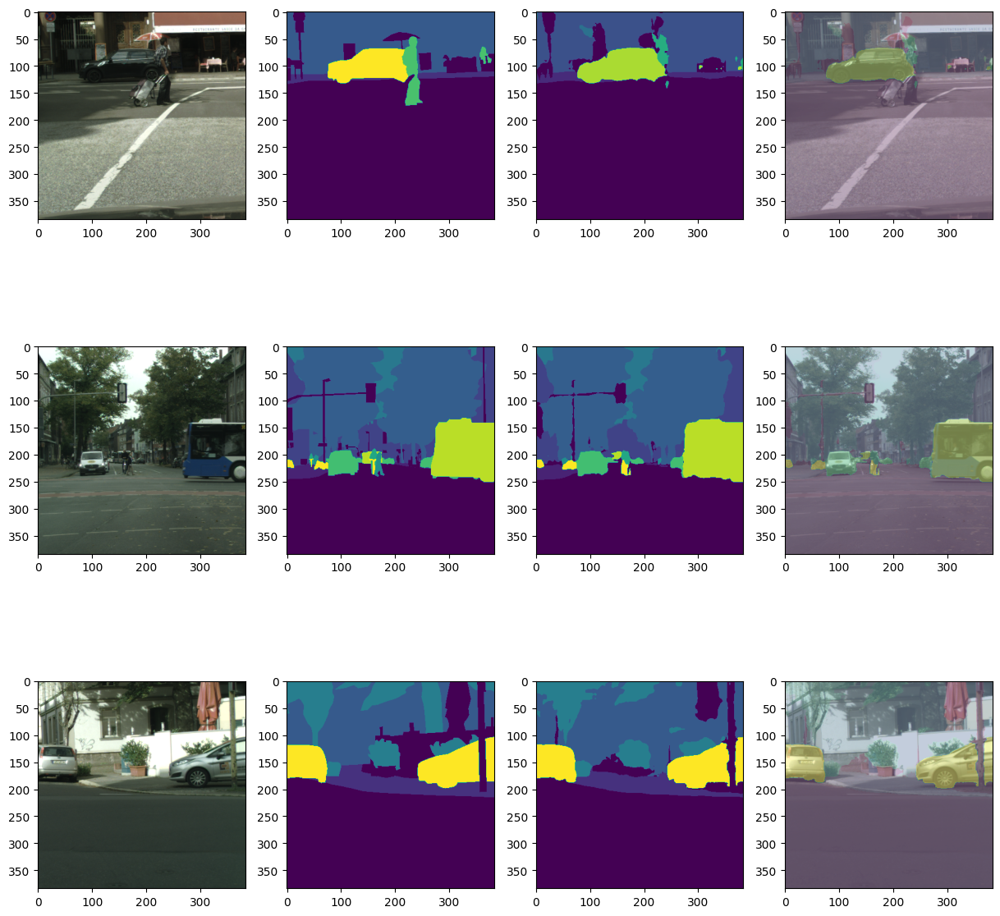

1/1 [==============================] - 0s 129ms/step


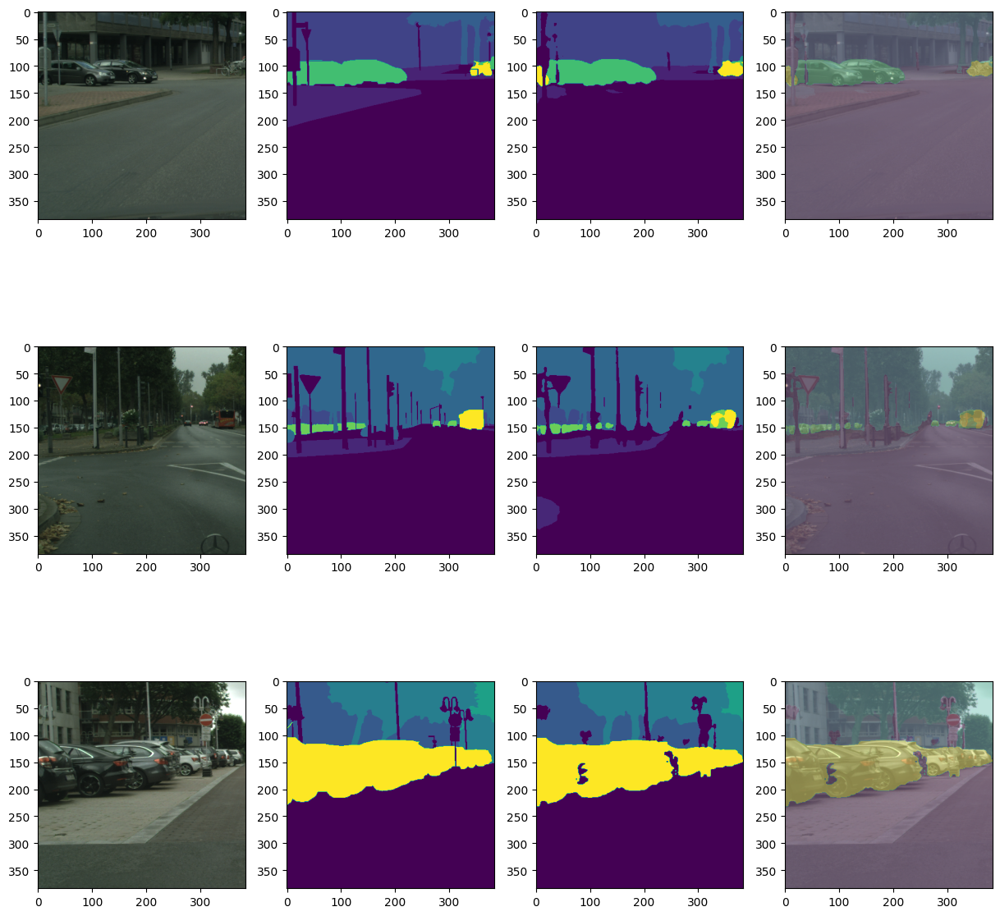

1/1 [==============================] - 0s 83ms/step


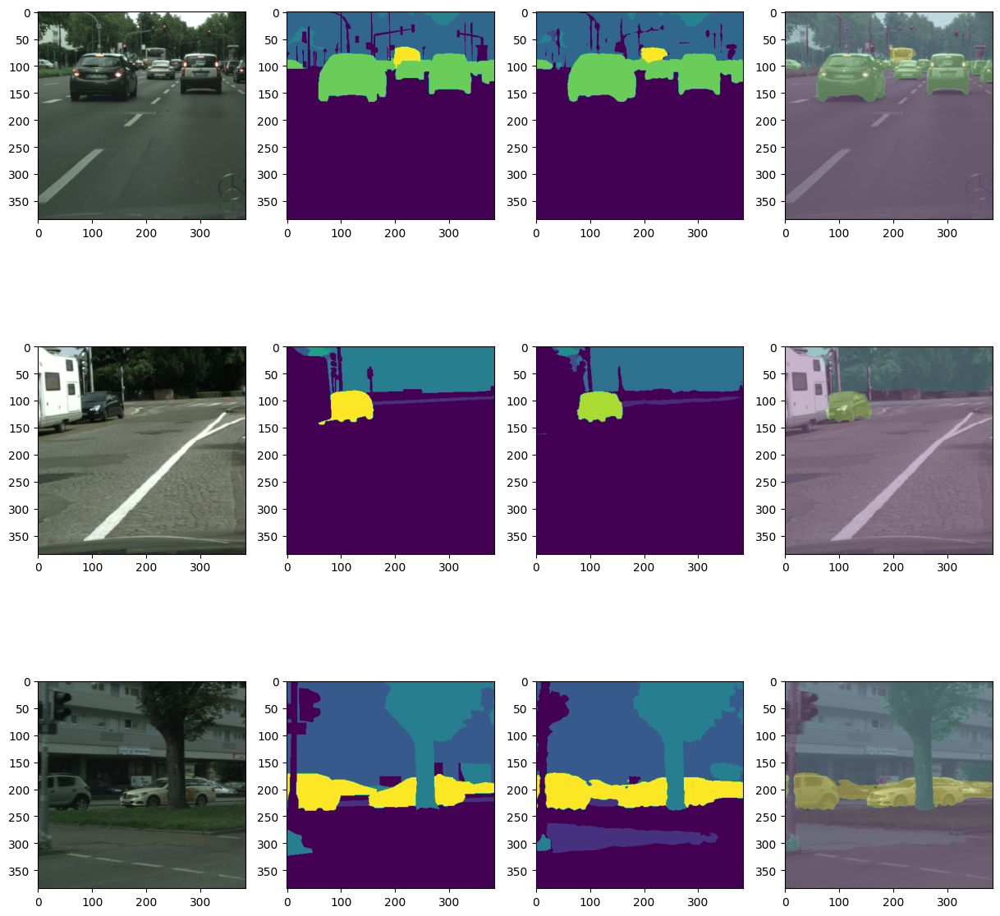

1/1 [==============================] - 0s 120ms/step


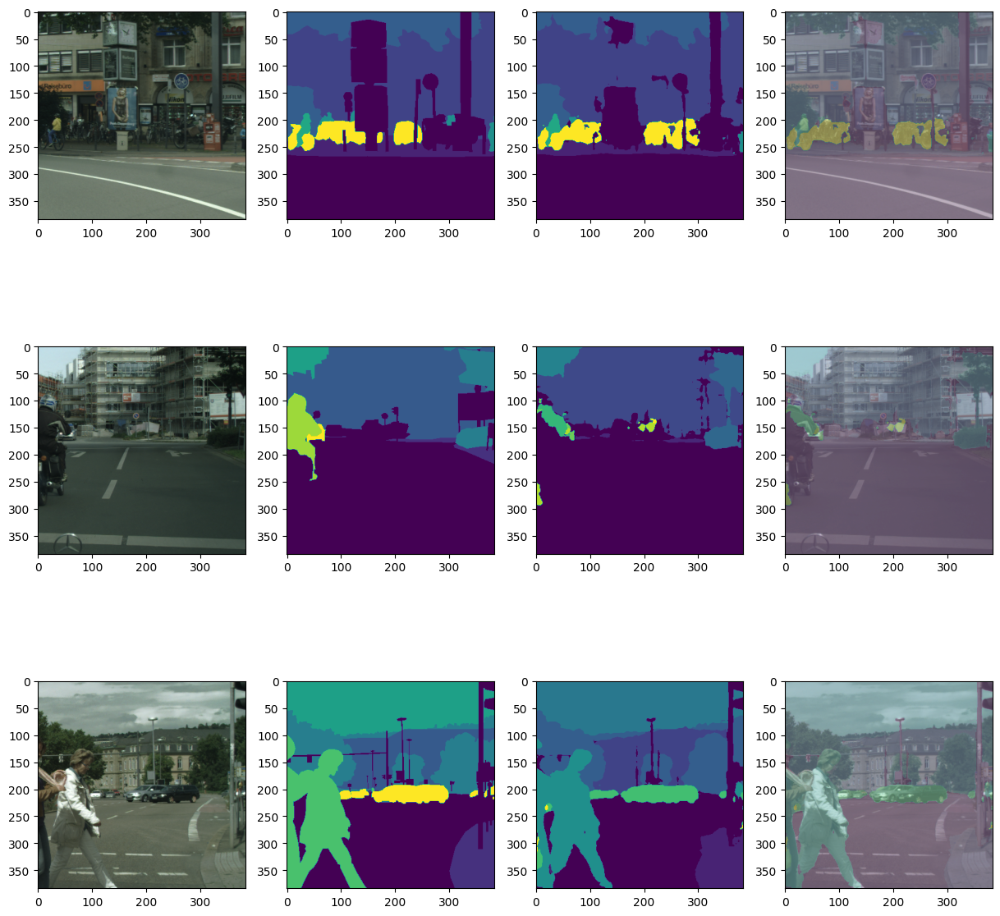

1/1 [==============================] - 0s 143ms/step


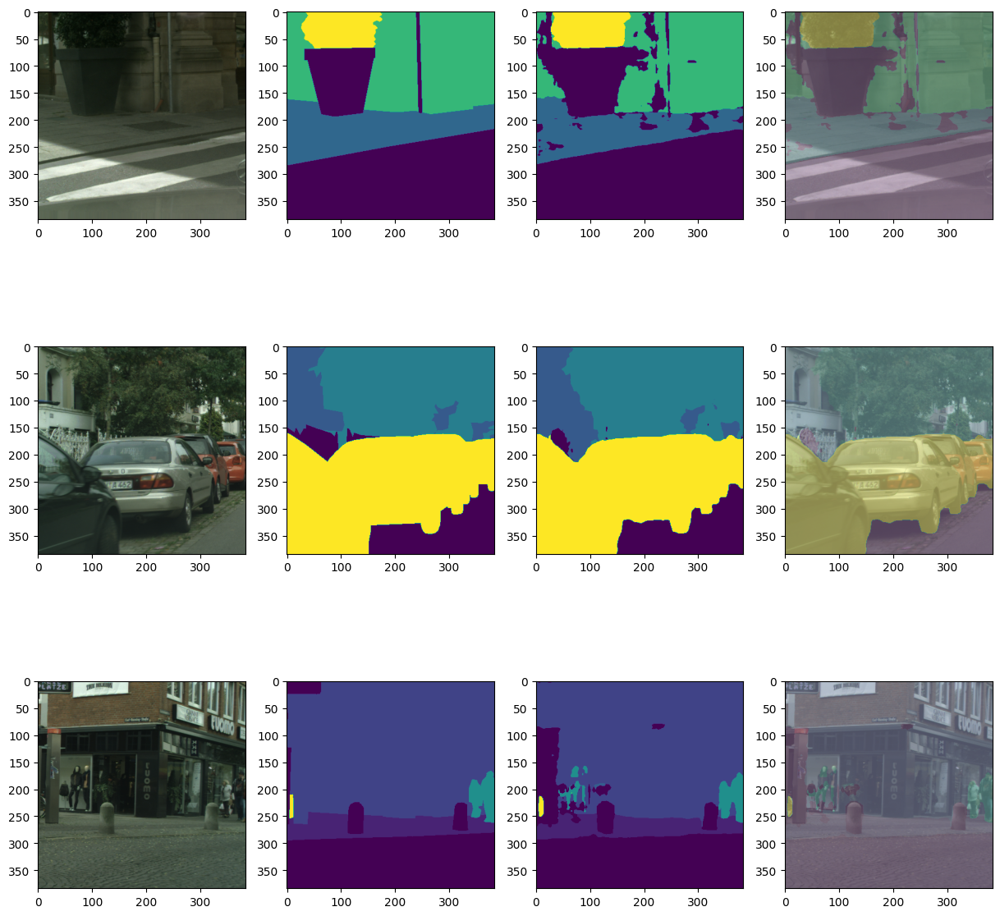

1/1 [==============================] - 0s 167ms/step


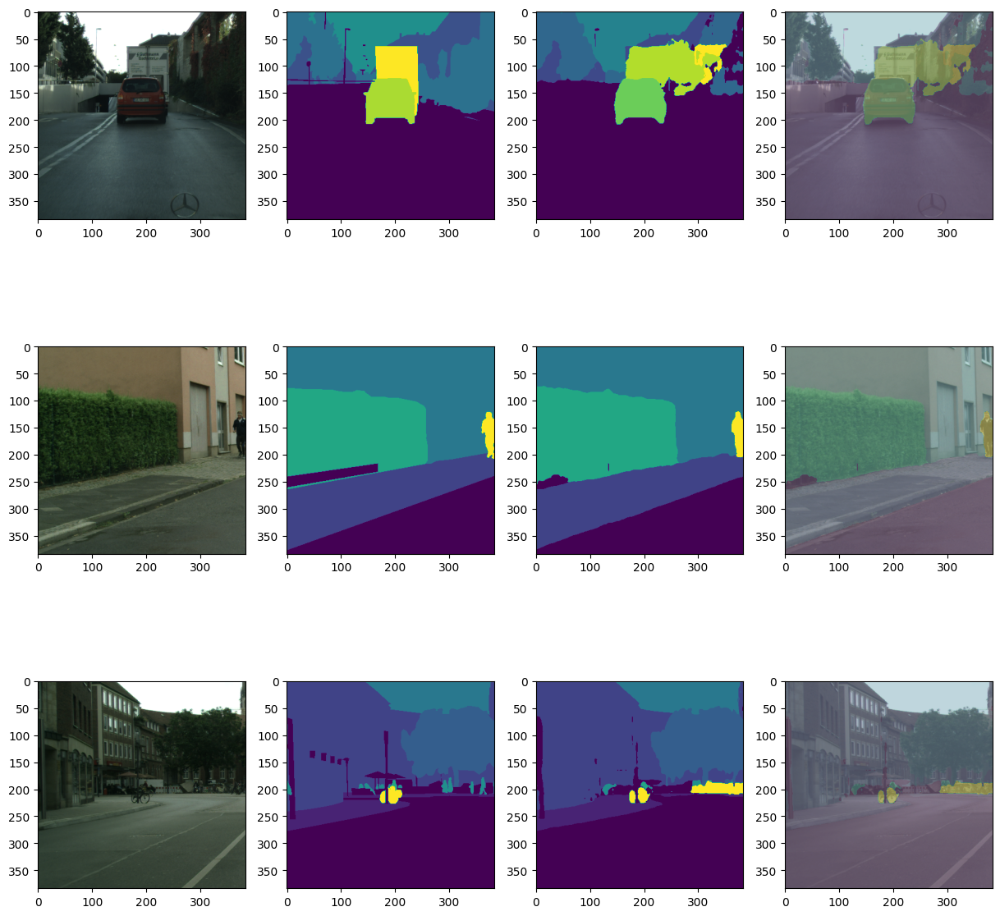

1/1 [==============================] - 0s 83ms/step


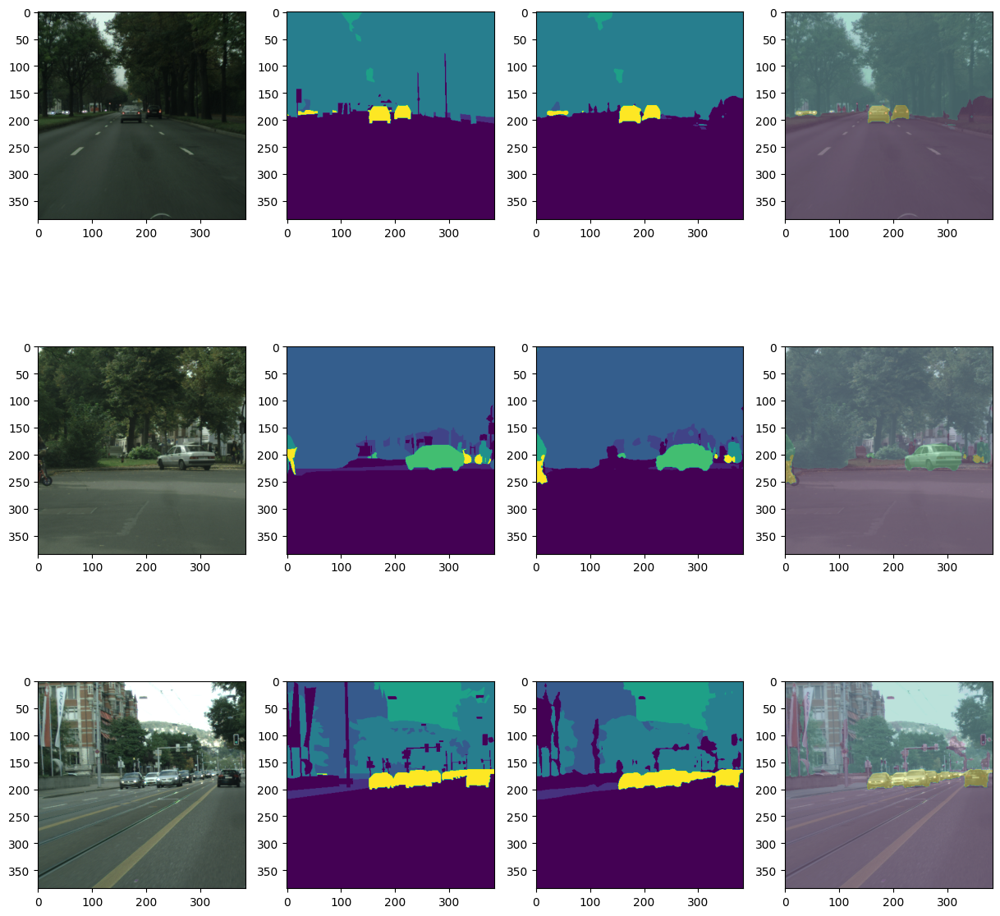

Mean IoU:  0.7384786
Accuracy:  0.9235563
Precision:  0.94268084
Recall:  0.9418723


In [19]:
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

miou_metric = MeanIoU(num_classes=11)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

model.save_weights('new_weight.h5')
model.load_weights('new_weight.h5')

# class_colors = {
#     0: 'red',
#     1: 'green',
#     2: 'blue',
#     3: 'cyan',
#     4: 'magenta',
#     5: 'yellow',
#     6: 'black',
#     7: 'white',
#     8: 'grey',
#     9: 'orange',
#     10: 'purple'
# }

# def draw_color_mapping(fig):
#     ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
#     ax.axis('off')
#     for i, (class_id, color) in enumerate(class_colors.items()):
#         ax.text(0.5, 1 - (i / len(class_colors)), f'Class {class_id}', ha='center', va='center', color=color, transform=ax.transAxes)

num = 3
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    fig = plt.figure(figsize=(15, num * 5))
    for i in range(num):
        miou_metric.update_state(mask, pred_mask)
        accuracy_metric.update_state(mask, pred_mask)
        precision_metric.update_state(mask, pred_mask)
        recall_metric.update_state(mask, pred_mask)
        
        plt.subplot(num, 4, i * 4 + 1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        
        plt.subplot(num, 4, i * 4 + 2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        
        plt.subplot(num, 4, i * 4 + 3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))
        
        plt.subplot(num, 4, i * 4 + 4)
        overlay_mask = tf.keras.preprocessing.image.array_to_img(pred_mask[i])
        overlay_image = tf.keras.preprocessing.image.array_to_img(image[i])
        plt.imshow(overlay_image, alpha=0.7)
        plt.imshow(overlay_mask, alpha=0.3)
    
    plt.show()

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()  
    
print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

1/1 [==============================] - 0s 130ms/step


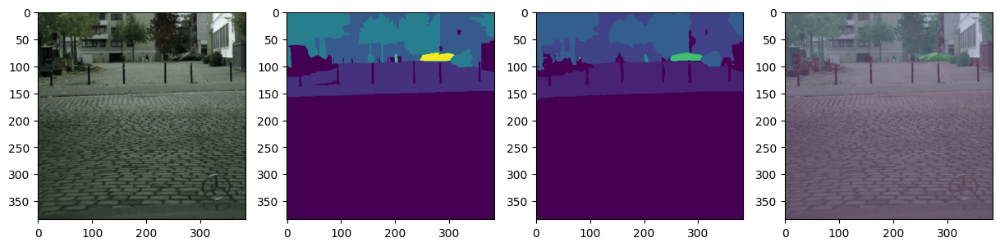

1/1 [==============================] - 0s 140ms/step


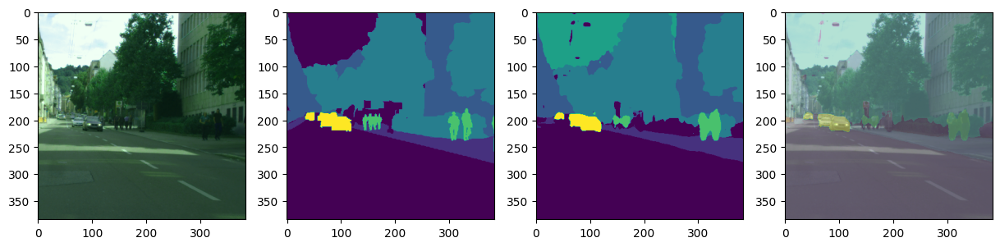

1/1 [==============================] - 0s 156ms/step


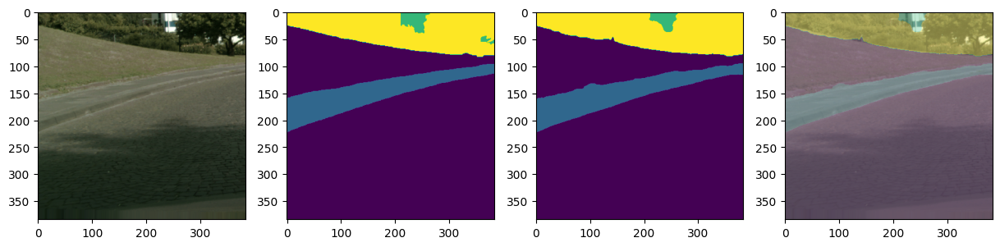

1/1 [==============================] - 0s 104ms/step


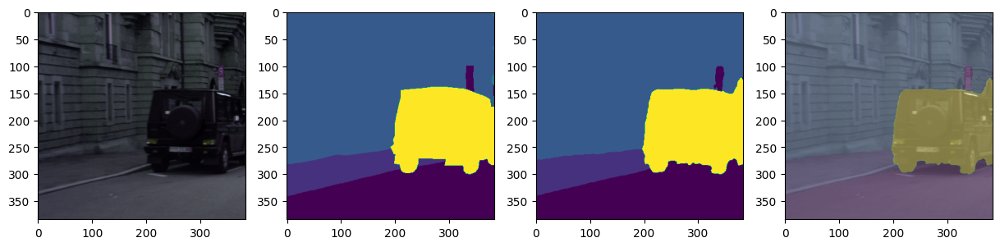

1/1 [==============================] - 0s 128ms/step


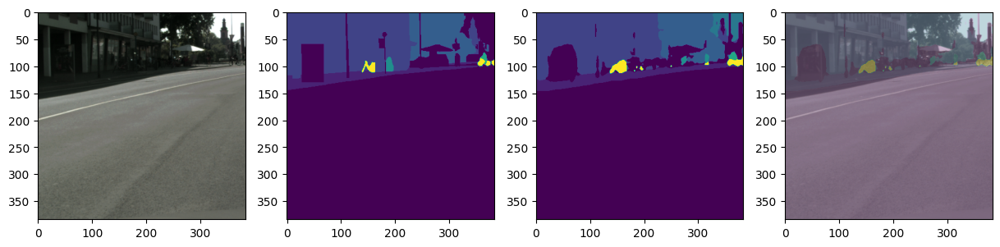

1/1 [==============================] - 0s 150ms/step


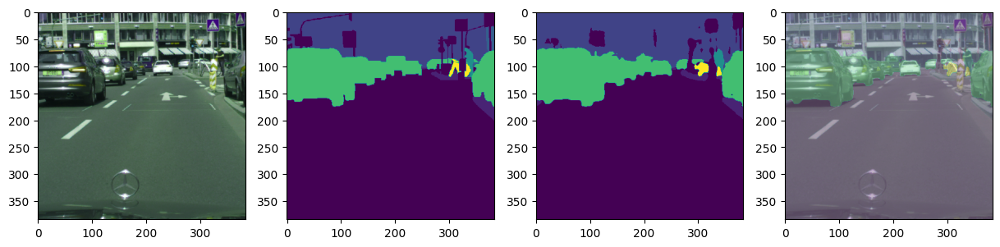

1/1 [==============================] - 0s 130ms/step


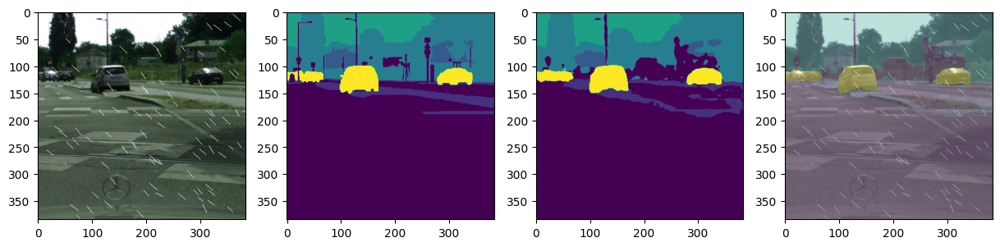

1/1 [==============================] - 0s 122ms/step


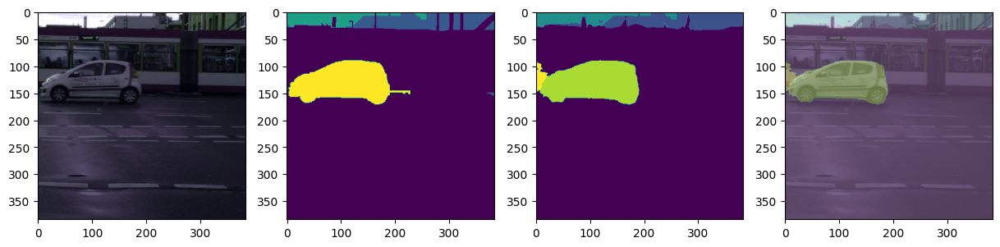

1/1 [==============================] - 0s 130ms/step


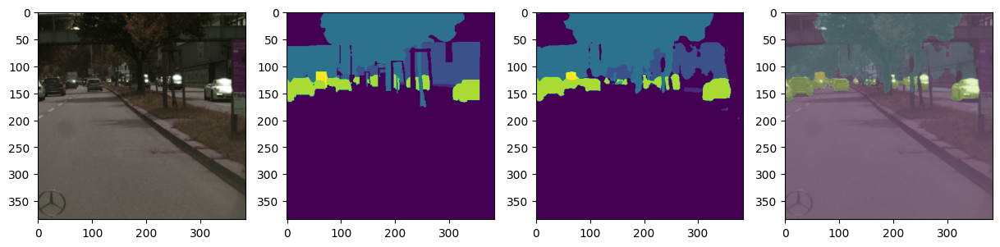

1/1 [==============================] - 0s 79ms/step


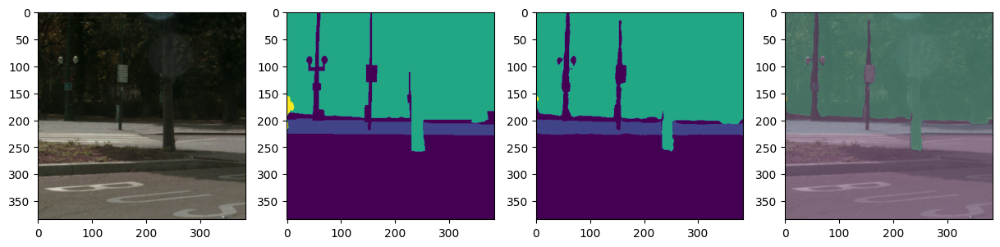

Mean IoU:  0.7384786
Accuracy:  0.9235563
Precision:  0.94268084
Recall:  0.9418723


In [20]:
num = 1
for image, mask in dataset_train.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    fig = plt.figure(figsize=(15, num * 5))
    for i in range(num):
        plt.subplot(num, 4, i * 4 + 1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        
        plt.subplot(num, 4, i * 4 + 2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        
        plt.subplot(num, 4, i * 4 + 3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))
        
        plt.subplot(num, 4, i * 4 + 4)
        overlay_mask = tf.keras.preprocessing.image.array_to_img(pred_mask[i])
        overlay_image = tf.keras.preprocessing.image.array_to_img(image[i])
        plt.imshow(overlay_image, alpha=0.7)
        plt.imshow(overlay_mask, alpha=0.3)
    
    plt.show()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

In [21]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

model.load_weights('new_weight.h5')

num_classes = 11
miou_metric = MeanIoU(num_classes=num_classes)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

metrics_values = {
    'mIoU': miou_metric.result().numpy(),
    'Accuracy': accuracy_metric.result().numpy(),
    'Precision': precision_metric.result().numpy(),
    'Recall': recall_metric.result().numpy(),
}

confusion_matrix = miou_metric.get_weights()[0]
ious = [(confusion_matrix[i, i] / (np.sum(confusion_matrix[:, i]) + np.sum(confusion_matrix[i, :]) - confusion_matrix[i, i] + 1e-7)) for i in range(num_classes)]
miou = np.mean(ious)
metrics_df = pd.DataFrame({'Class ID': list(range(num_classes)) + ['Overall'], 'IoU': ious + [miou]})

print(metrics_values)
print(metrics_df)


1/1 [==============================] - 0s 82ms/step
{'mIoU': 0.7441803, 'Accuracy': 0.9243823, 'Precision': 0.9454423, 'Recall': 0.94201434}
   Class ID       IoU
0         0  0.892838
1         1  0.684398
2         2  0.837019
3         3  0.868017
4         4  0.920342
5         5  0.688505
6         6  0.482025
7         7  0.904066
8         8  0.564450
9         9  0.698940
10       10  0.645383
11  Overall  0.744180


In [22]:
import numpy as np
from sklearn.metrics import confusion_matrix

def pixel_accuracy(confusion_matrix):
    correct_pixels = np.diag(confusion_matrix).sum()
    total_pixels = confusion_matrix.sum()
    return correct_pixels / total_pixels

def class_wise_pixel_accuracy(confusion_matrix):
    class_accuracies = np.diag(confusion_matrix) / confusion_matrix.sum(axis=1)
    return np.nanmean(class_accuracies)

def mean_pixel_accuracy(confusion_matrix):
    return np.diag(confusion_matrix).sum() / confusion_matrix.sum()

def dice_coefficient(confusion_matrix):
    true_positives = np.diag(confusion_matrix)
    false_negatives = np.sum(confusion_matrix, axis=1) - true_positives
    false_positives = np.sum(confusion_matrix, axis=0) - true_positives
    dice = 2 * true_positives / (2 * true_positives + false_positives + false_negatives)
    return np.nanmean(dice)

y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    y_true_list.extend(np.asarray(mask).flatten())
    y_pred_list.extend(pred_mask.flatten())

num_classes = 11  
cm = confusion_matrix(y_true_list, y_pred_list, labels=range(num_classes))

pa = pixel_accuracy(cm)
cpa = class_wise_pixel_accuracy(cm)
mpa = mean_pixel_accuracy(cm)
dice = dice_coefficient(cm)

print("Pixel Accuracy (PA):", pa)
print("Class-wise Pixel Accuracy (CPA):", cpa)
print("Mean Pixel Accuracy (MPA):", mpa)
print("Dice Coefficient:", dice)

1/1 [==============================] - 0s 71ms/step
Pixel Accuracy (PA): 0.9241354084700989
Class-wise Pixel Accuracy (CPA): 0.8234078681740326
Mean Pixel Accuracy (MPA): 0.9241354084700989
Dice Coefficient: 0.8348819199332419


In [23]:
import numpy as np
from sklearn.metrics import cohen_kappa_score, jaccard_score

y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    mask = mask.numpy().flatten()
    pred_mask = pred_mask.flatten()
    
    y_true_list.extend(mask)
    y_pred_list.extend(pred_mask)

kappa = cohen_kappa_score(y_true_list, y_pred_list)

jaccard = jaccard_score(y_true_list, y_pred_list, average='macro')


print("Kappa Score:", kappa)
print("Jaccard Similarity Score:", jaccard)
# print("Frequency Weighted Intersection over Union:", fw_iou)

1/1 [==============================] - 0s 87ms/step
Kappa Score: 0.886494222402445
Jaccard Similarity Score: 0.7143861646573397


In [24]:
import time
import tensorflow as tf

total_frames = 0
start_time = time.time()

for images, _ in dataset_val:
    if total_frames == 0:
        _ = model(images, training=False)
        
    start = time.time()
    _ = model(images, training=False)
    end = time.time()
    
    total_frames += images.shape[0]
    print(f"Processed {images.shape[0]} frames in {end - start:.4f} seconds.")

end_time = time.time()
total_time = end_time - start_time

fps = total_frames / total_time
print(f"Model FPS on validation dataset: {fps:.2f}")


Processed 24 frames in 0.1084 seconds.
Processed 24 frames in 0.1157 seconds.
Processed 24 frames in 0.1760 seconds.
Processed 24 frames in 0.1492 seconds.
Processed 24 frames in 0.1383 seconds.
Processed 24 frames in 0.2043 seconds.
Processed 24 frames in 0.1334 seconds.
Processed 24 frames in 0.2163 seconds.
Processed 24 frames in 0.2231 seconds.
Processed 24 frames in 0.2238 seconds.
Processed 24 frames in 0.1185 seconds.
Processed 24 frames in 0.2204 seconds.
Processed 24 frames in 0.2220 seconds.
Processed 24 frames in 0.1623 seconds.
Processed 24 frames in 0.2099 seconds.
Processed 24 frames in 0.2293 seconds.
Processed 24 frames in 0.1418 seconds.
Processed 24 frames in 0.2188 seconds.
Processed 24 frames in 0.2143 seconds.
Processed 24 frames in 0.2151 seconds.
Processed 24 frames in 0.2419 seconds.
Processed 24 frames in 0.1560 seconds.
Processed 24 frames in 0.1730 seconds.
Processed 24 frames in 0.2164 seconds.
Processed 24 frames in 0.1647 seconds.
Processed 24 frames in 0.